# Study Kr response - Sophronia

JAH 1/05/2025

### imports

In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [3]:
import numpy             as np
import pandas            as pd
import tables            as tb
from   scipy             import stats
from   scipy             import optimize

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d

#pd.options.mode.copy_on_write = True 

#plt.rcParams['image.cmap'] = 'rainbow'

In [4]:
import ipywidgets as widgets
from IPython.display import display
import time

In [5]:
import os
import sys
pypaths= ("/Users/hernando/work/investigacion/NEXT/software/nextana",
         "/Users/hernando/work/investigacion/NEXT/software/hipy",
         "/Users/hernando/work/investigacion/NEXT/software/IC")
for ipypath in pypaths:
       sys.path.insert(0,ipypath)

In [6]:
import hipy.utils        as ut
import hipy.pltext       as pltext
import hipy.profile      as prof
import hipy.styles       as pltsty

pltsty.style('jhep')


In [7]:
import nana.kr.kr100ana  as krn100

In [8]:
#from invisible_cities.io  . pmaps_io        import load_pmaps, load_pmaps_as_df
from invisible_cities.io.dst_io import load_dst, load_dsts
from invisible_cities.core.core_functions import in_range

### configuration

### load data

In [13]:
path_data     =  "/Users/hernando/work/investigacion/NEXT/data/NEXT100/data"
#run, prod_version  = 15270,  "v2.3.1/20250429"
run, prod_version  = 15332,  "v2.3.1/20250512"
run, prod_version  = 15502,  "v2.3.1/20250512" # Calibration DB OK - castle close
ldc           = "ldc1"
path_run  =  f"/{run}/hdf5/prod/{prod_version}/sophronia/trigger1/ldc1"

In [14]:
path = path_data + path_run
filenames = os.listdir(path)
filenames = [os.path.join(path, f) for f in filenames]
#for f in filenames: print(f)

In [15]:
kdst  = load_dsts(filenames, "DST", "Events")
print("Number of events ", len(kdst.event.unique()))
print("Number of S1-S1  ", len(kdst))

#hits  = load_dsts(filenames, "RECO", "Events")

Number of events  405913
Number of S1-S1   1011056


In [16]:
print(kdst.columns)
#print(hits.columns)

Index(['event', 'time', 's1_peak', 's2_peak', 'nS1', 'nS2', 'S1w', 'S1h',
       'S1e', 'S1t', 'S2w', 'S2h', 'S2e', 'S2q', 'S2t', 'qmax', 'Nsipm', 'DT',
       'Z', 'Zrms', 'X', 'Y', 'R', 'Phi', 'Xrms', 'Yrms'],
      dtype='object')


### Extending the kdst

In [17]:
kdst = krn100.df_extend(kdst)

## General monitoring

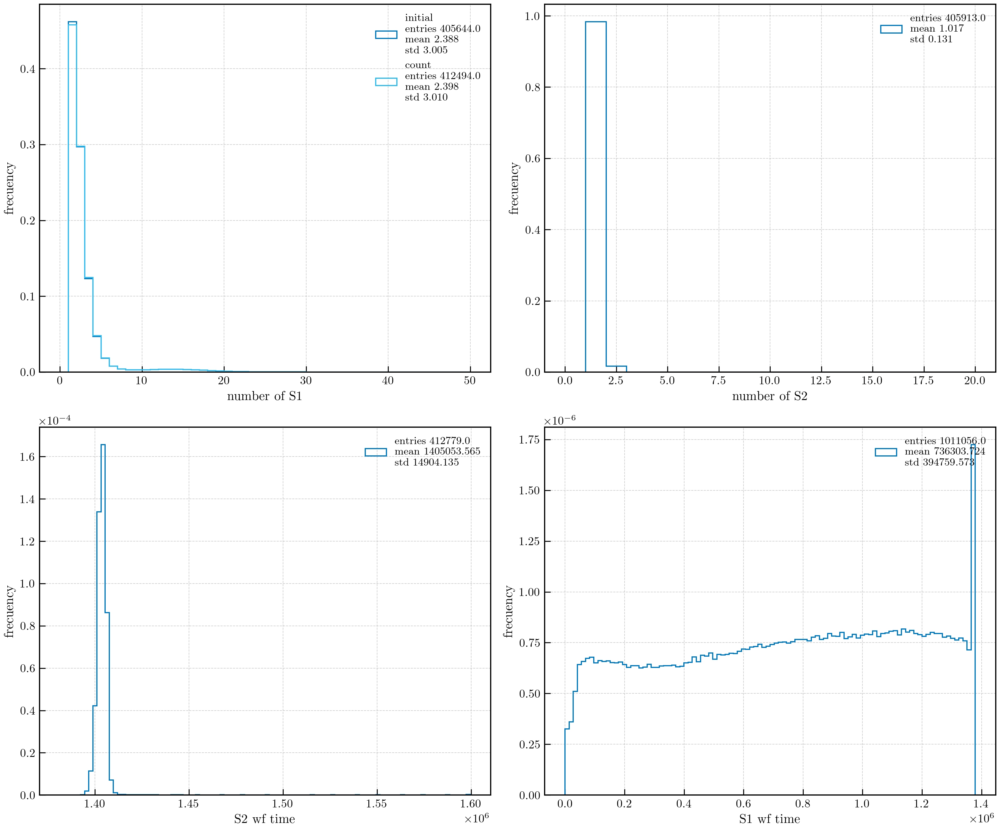

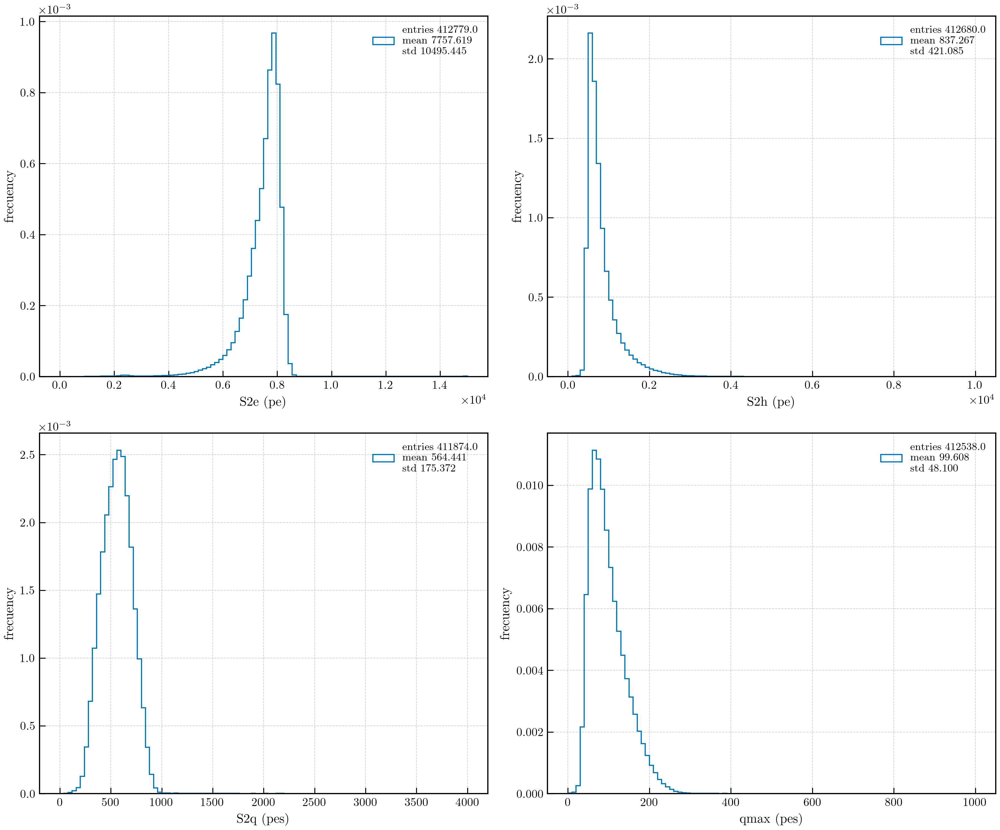

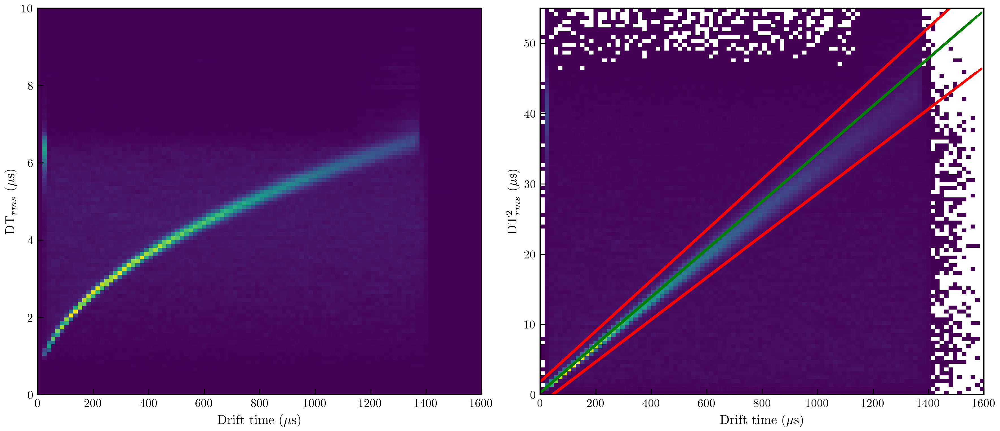

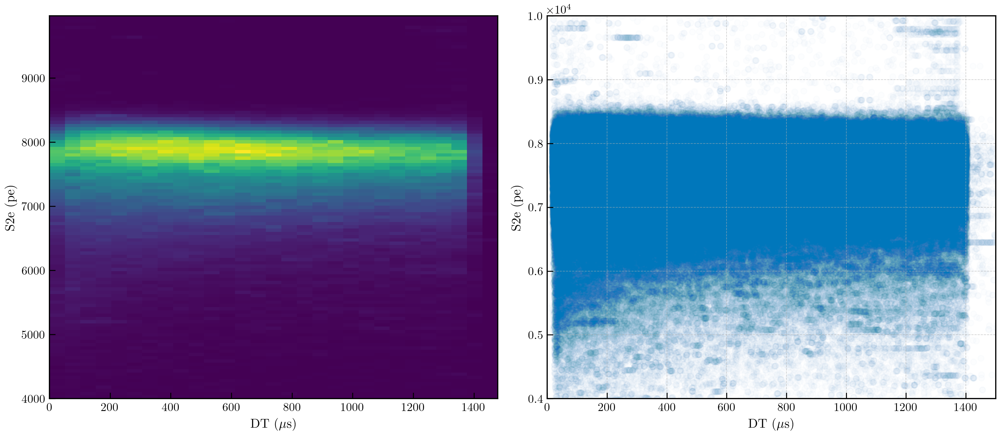

In [18]:
krn100.monitor_S1S2(kdst)
krn100.monitor_S2(kdst)
krn100.monitor_S2s_dtime(kdst)
krn100.monitor_lifetime(kdst)

## Apply selection DST

In [19]:
kdst_    = krn100.df_apply_selection(kdst)

1S2 efficiency 0.9570, 967535/1011056.
S2 in trigger time efficiency 0.9829, 993750/1011056.
S1 in band efficiency 0.9829, 993750/1011056.
1S2 & S2 in trigger time & some S1 in band efficiency 0.4477, 452682/1011056.
1S1 in band efficiency 0.6424, 290819/452682.


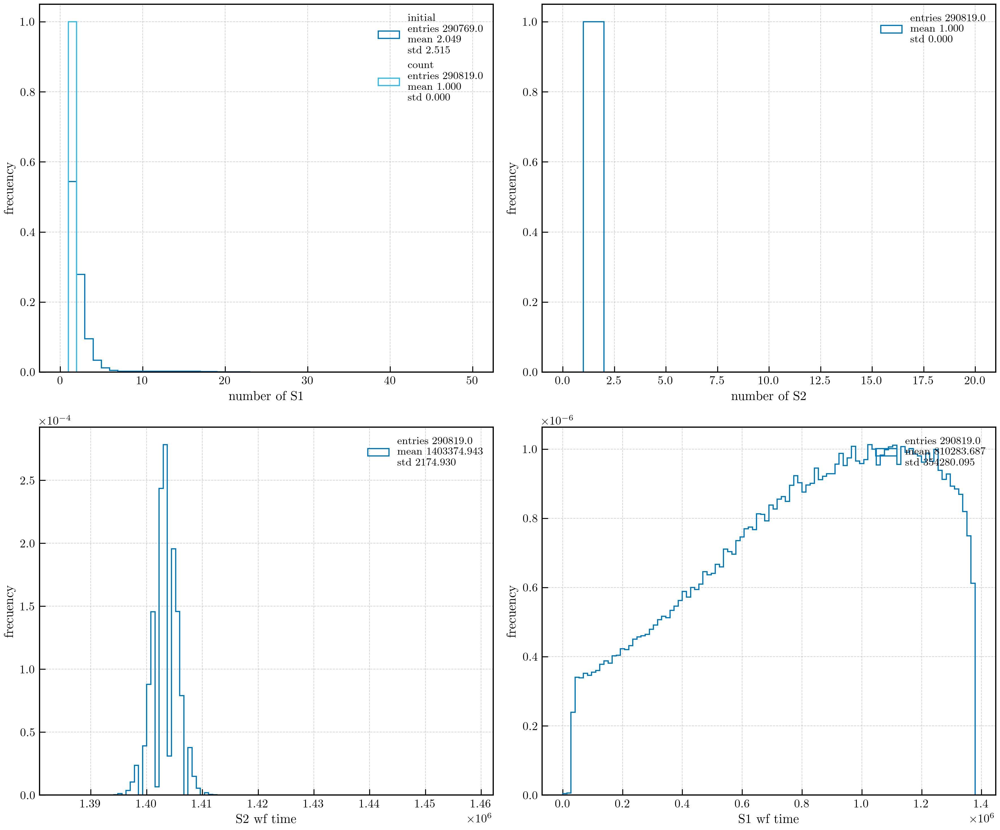

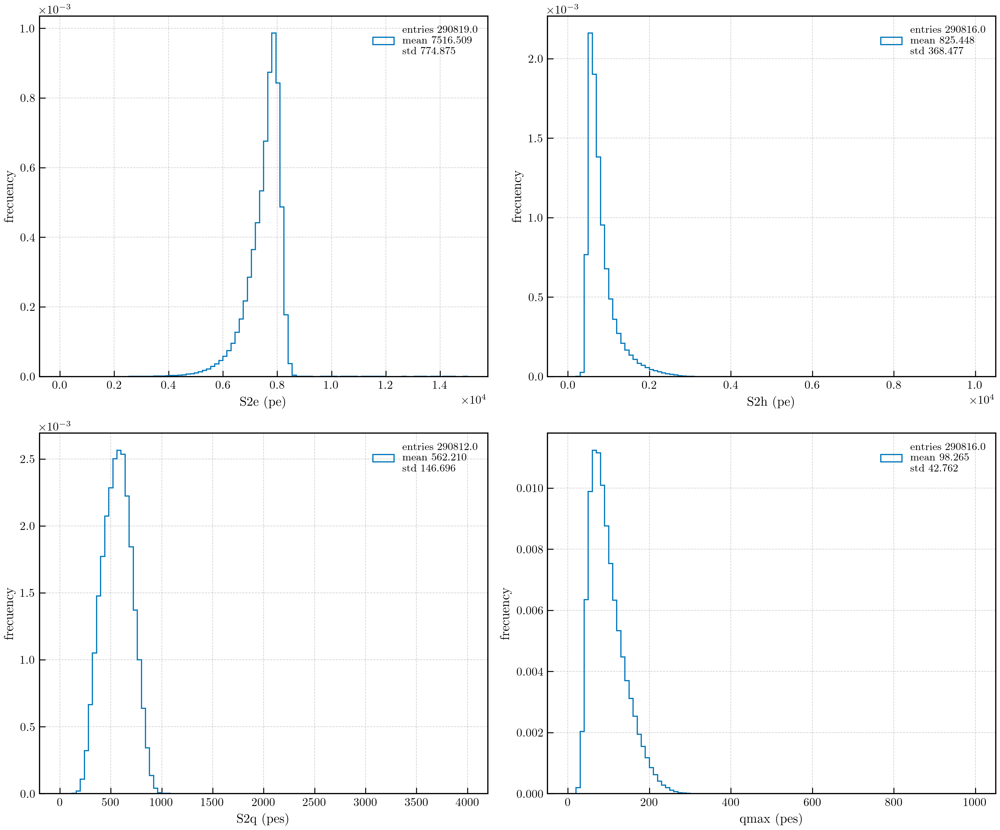

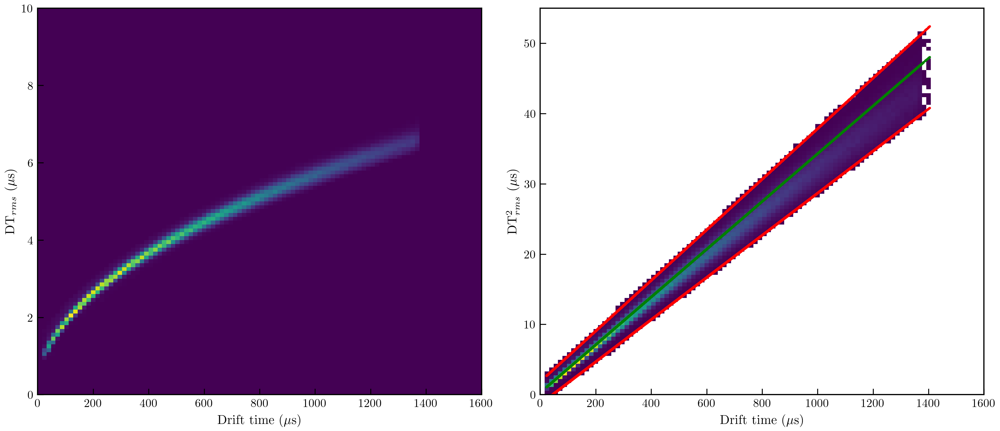

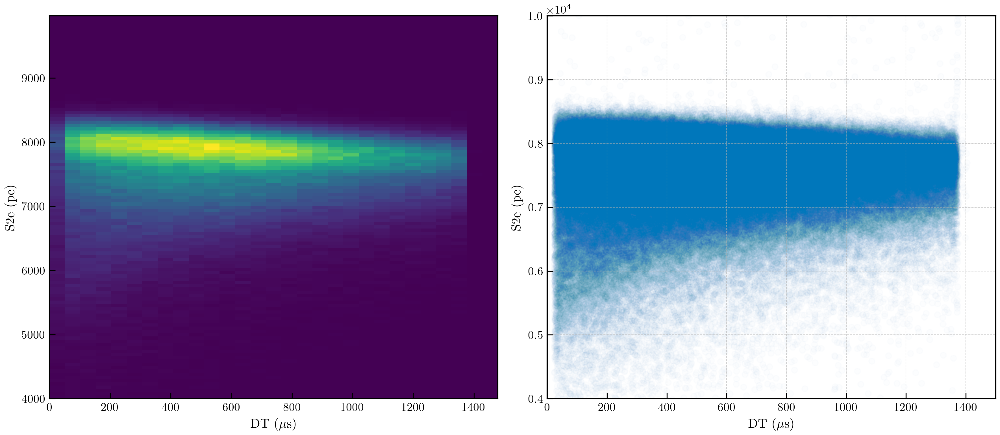

In [20]:
krn100.monitor_S1S2(kdst_)
krn100.monitor_S2(kdst_)
krn100.monitor_S2s_dtime(kdst_)
krn100.monitor_lifetime(kdst_)

 efficiency 0.6123, 178054/290819.


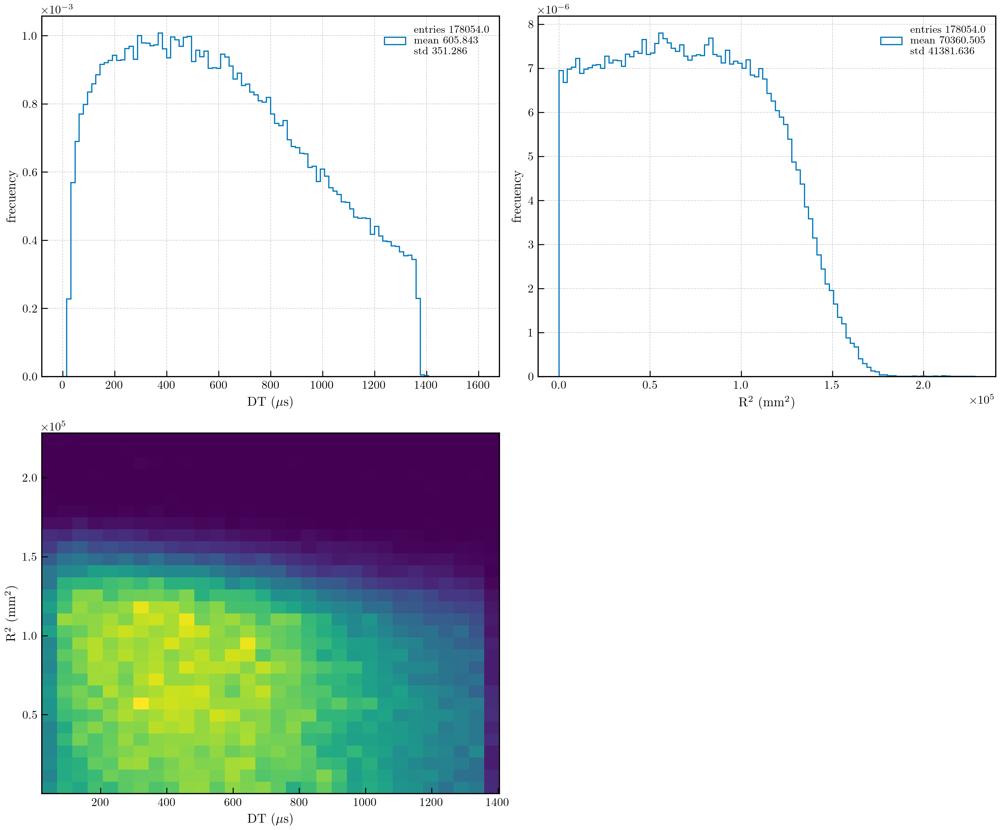

In [21]:
krn100.monitor_kr_distribution(kdst_)

### save event number

In [22]:
def sel_fidutial_lowenergy(df, range_S2e = (3.0e3, 10.e3), max_radius = 140.):
    sel1 = in_range(df.S2e, *range_S2e)
    krn100.eff_of_sel(sel1, 'range S2e')

    r2 = df.X**2 + df.Y**2
    sel2 = r2 < max_radius**2
    krn100.eff_of_sel(sel2, 'max radius')

    sel = sel1 & sel2
    krn100.eff_of_sel(sel, 'S23 range and max raidus')

    return sel

def df_save(df, ofile):

    r2 = df.X**2 + df.Y**2

    cv = pltext.canvas(4, 2)

    cv(1); pltext.hist(df.S2e, 100); plt.xlabel('S2e (pe)')
    cv(2); pltext.hist(r2, 100); plt.xlabel('r$^2$ (mm$^2$)');
    cv(3); pltext.hist(df.DT, 100); plt.xlabel('DT ($\mu$s)');

    print('number of events ', len(df.event.unique()));
    print('saving kdst ', ofile)
    df.to_hdf(ofile, key='kdst', mode='w', complevel=9, complib='blosc')
    return


range S2e efficiency 0.9982, 290290/290819.
max radius efficiency 1.0000, 290819/290819.
S23 range and max raidus efficiency 0.9982, 290290/290819.
number of events  290290
saving kdst  kdst_lowene_15502.h5


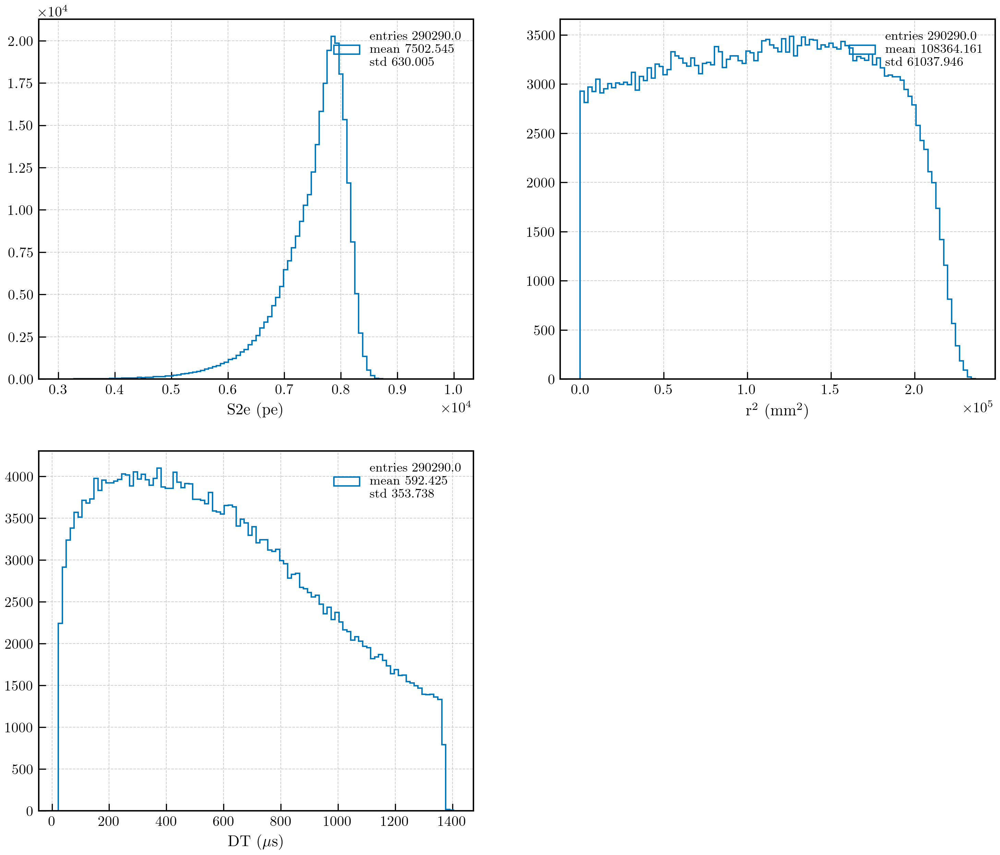

In [23]:
sel_lowene = krn100.sel_fidutial_lowenergy(kdst_, max_radius = 1400. * 2.)
df_save(kdst_[sel_lowene], f"kdst_lowene_{run}.h5")

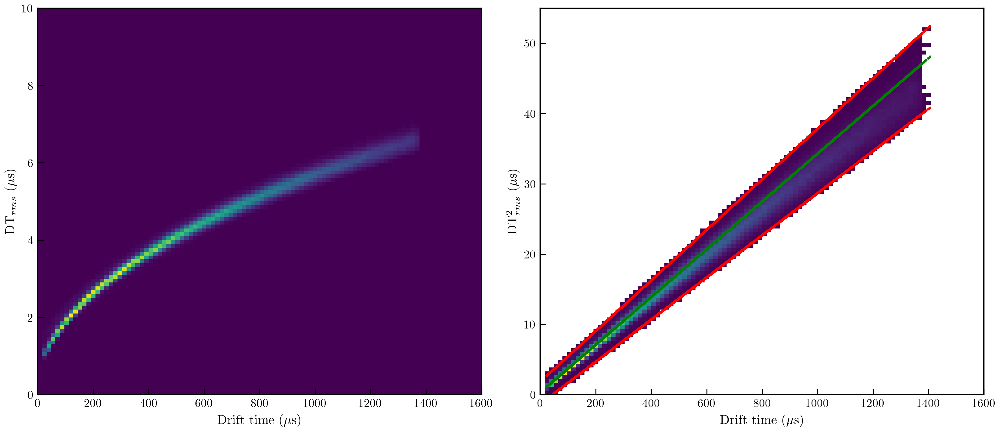

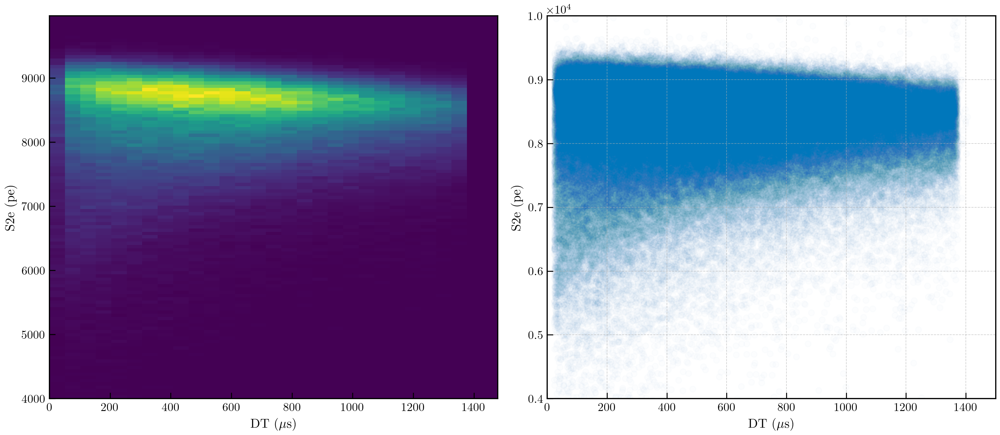

In [23]:
krn100.monitor_S2s_dtime(kdst_[sel_lowene])
krn100.monitor_lifetime(kdst_[sel_lowene])

In [24]:
kdst_2 = df = pd.read_hdf(f"kdst_lowene_{run}.h5", key='kdst')

 efficiency 0.6134, 178054/290290.


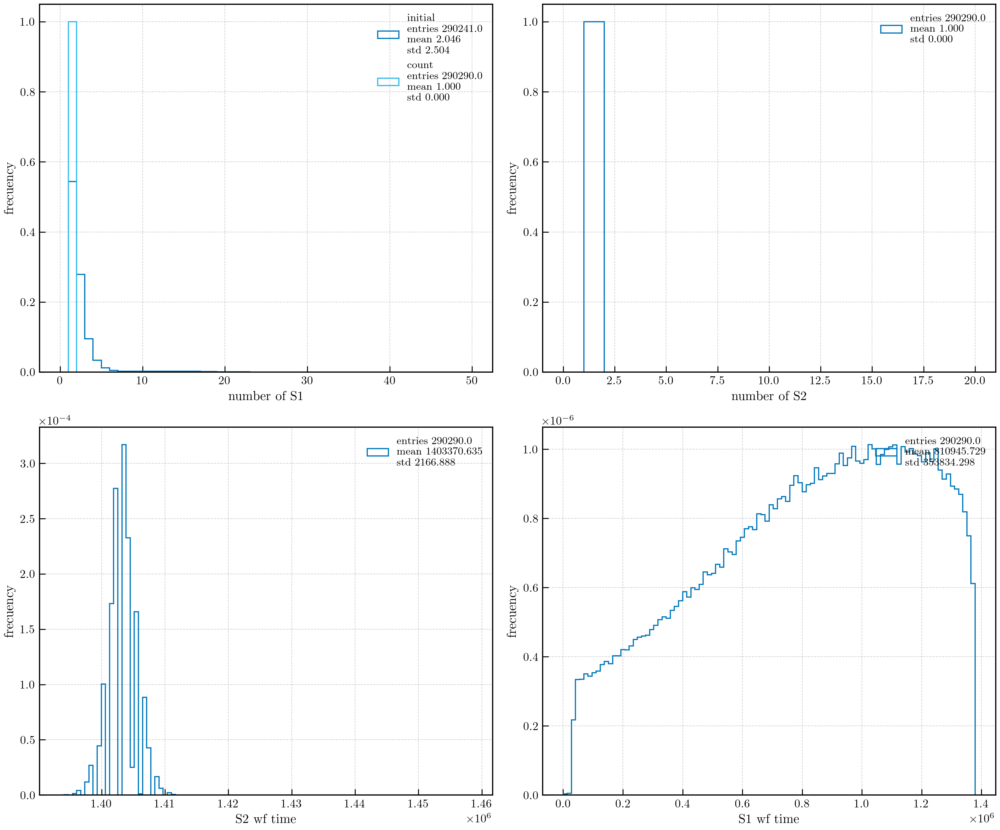

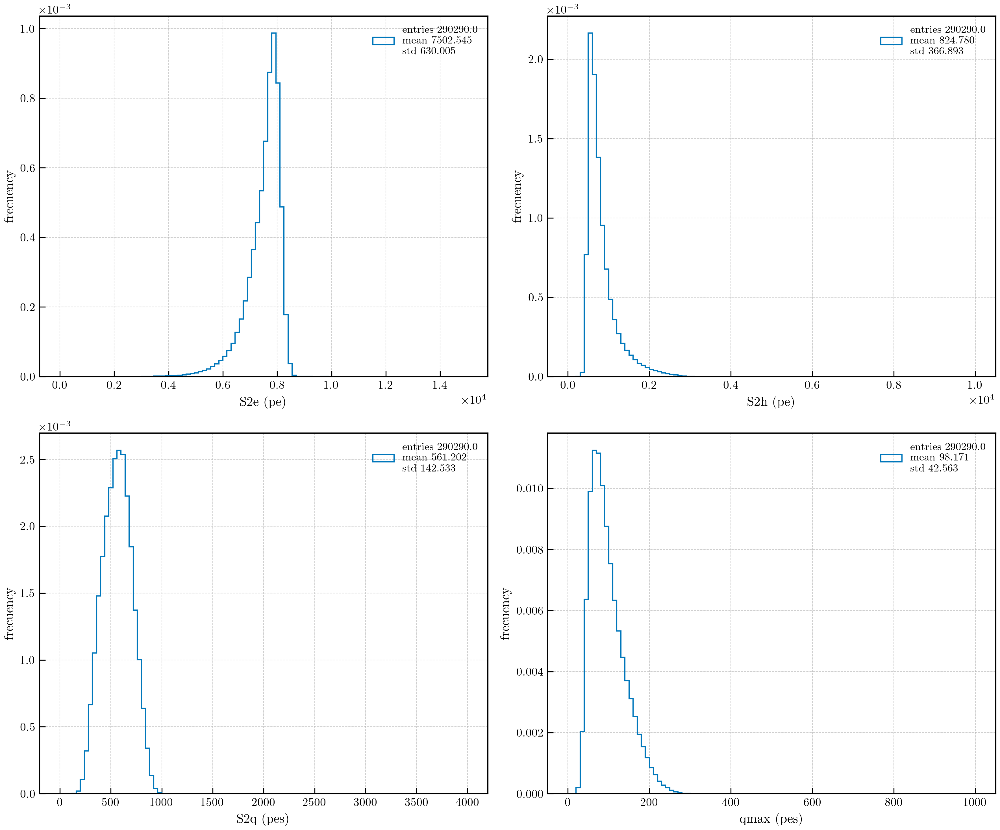

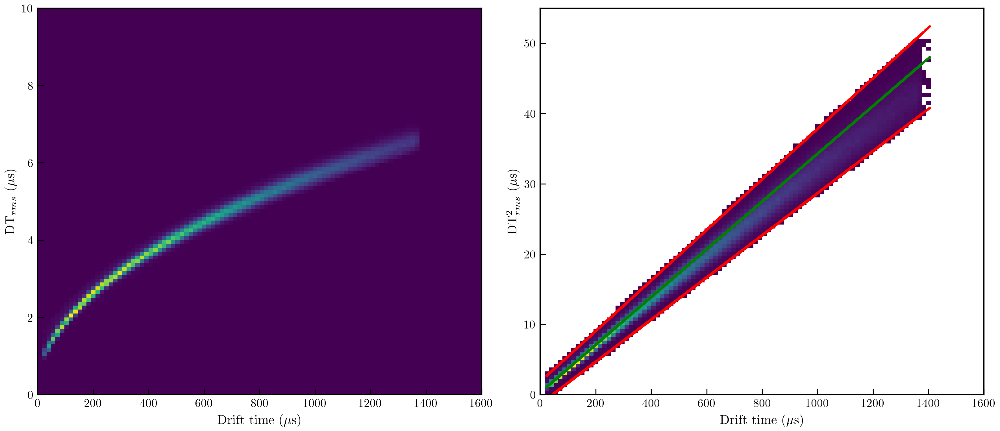

In [ ]:
krn100.monitor_S1S2(kdst_2)
krn100.monitor_S2(kdst_2)
krn100.monitor_S2s_dtime(kdst_2)
krn100.monitor_lifetime(kdst_2)
krn100.monitor_kr_distribution(kdst_2)

### Guess DT from S2 width

In [26]:
kdst_cc = krn100.df_compact_s1(kdst)
kdst_cc = krn100.df_apply_selection(kdst_cc) 
#kdst_cc = krn100.df_compact_s1(kdst)


1S2 efficiency 0.9632, 347200/360482.
S2 in trigger time efficiency 0.9865, 355614/360482.
S1 in band efficiency 0.9865, 355614/360482.
1S2 & S2 in trigger time & some S1 in band efficiency 0.9629, 347103/360482.
1S1 in band efficiency 1.0000, 347103/347103.


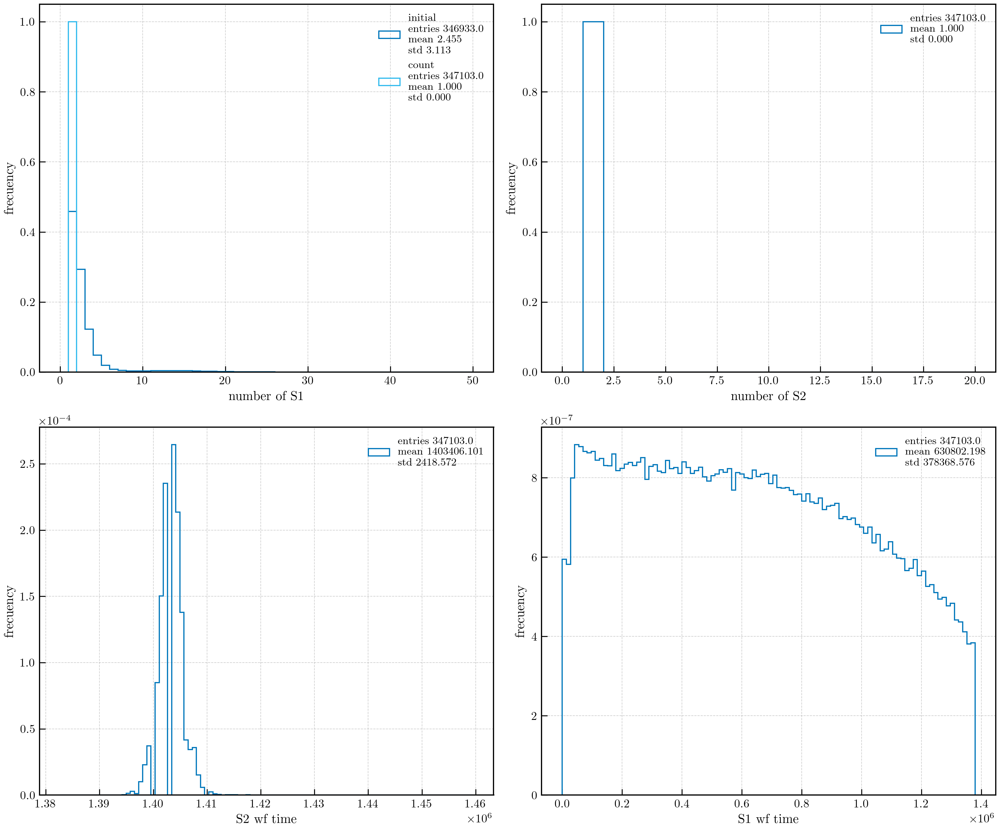

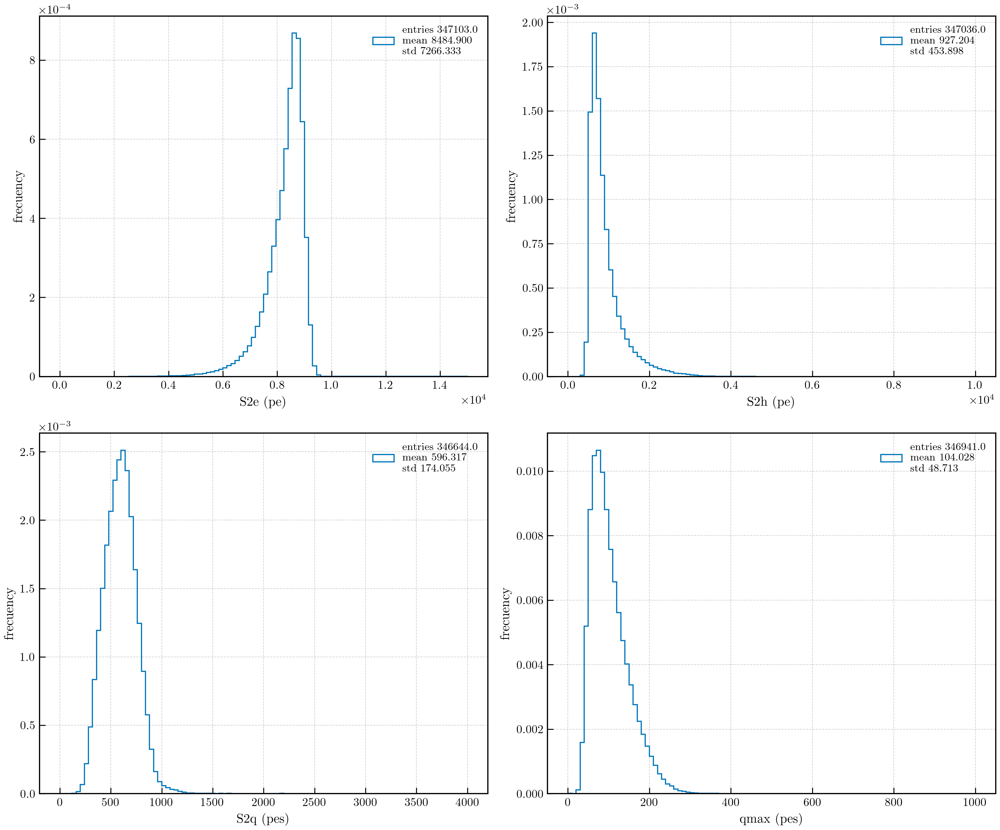

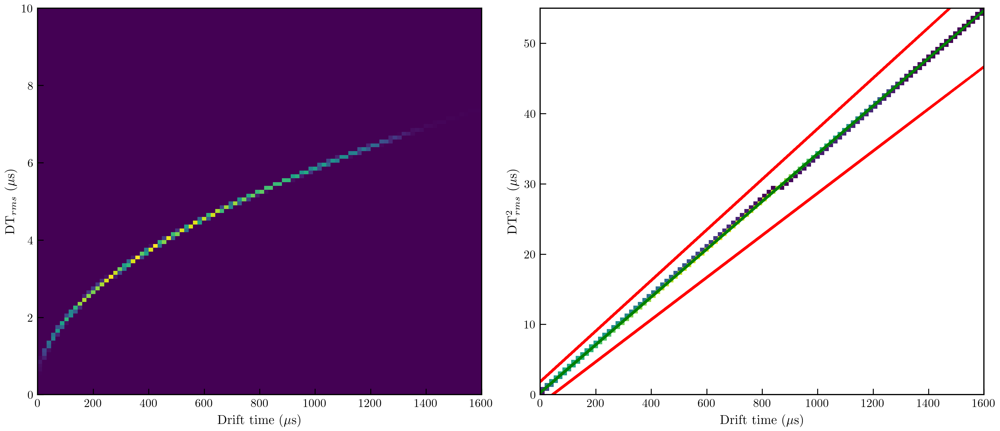

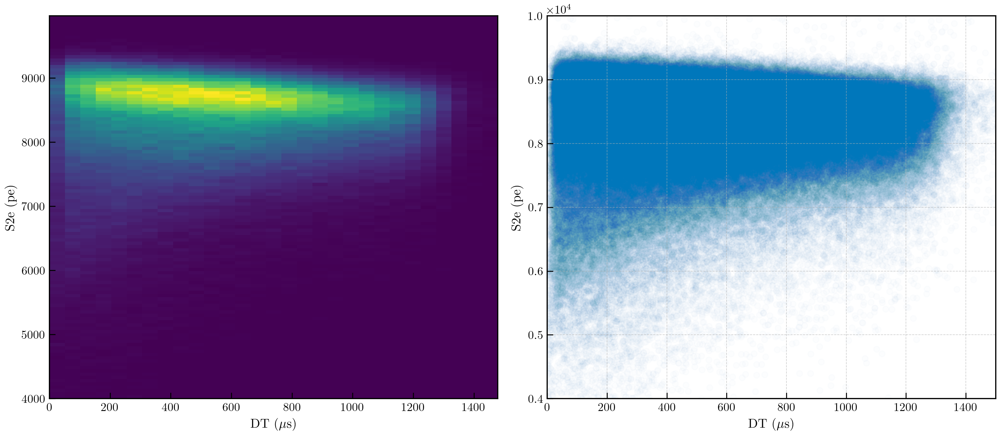

In [27]:
krn100.monitor_S1S2(kdst_cc)
krn100.monitor_S2(kdst_cc)
krn100.monitor_S2s_dtime(kdst_cc)
krn100.monitor_lifetime(kdst_cc)

 efficiency 0.2079, 32892/158192.


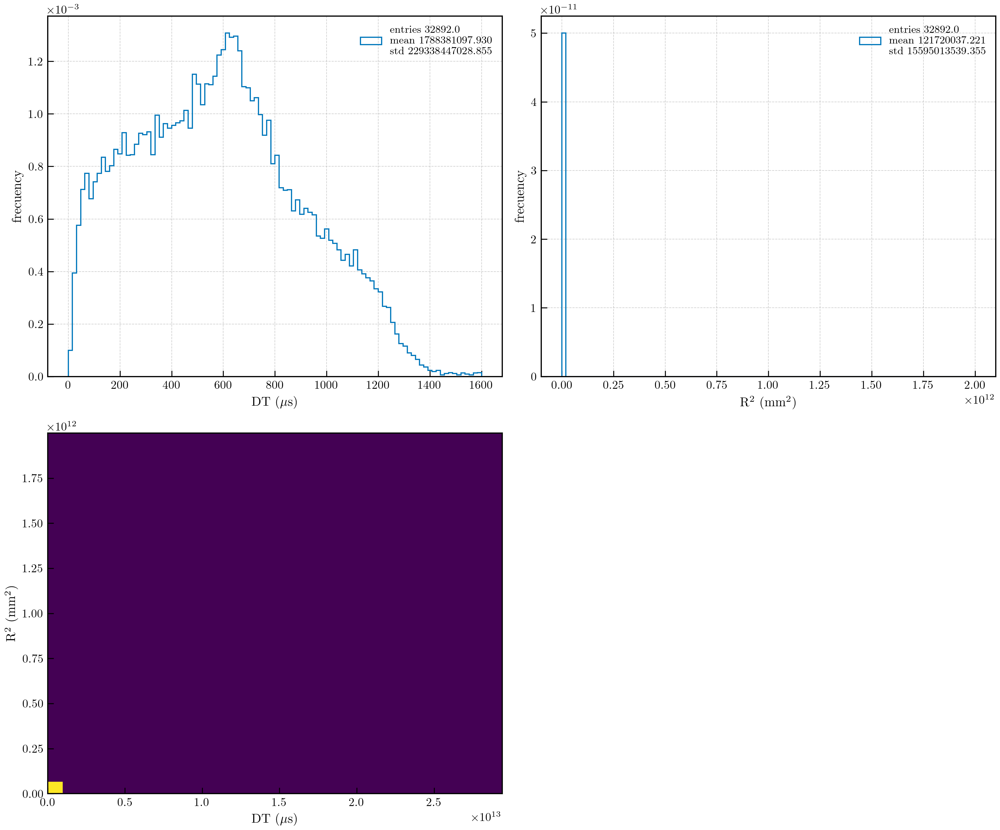

In [68]:
krn100.monitor_kr_distribution(kdst_cc)